<h1>Install the Necessary Libraries</h1>

In [1]:
pip install xgboost shap

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install xgboost shap

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
import scipy.stats
import sklearn
import xgboost
import shap


print("SHAP version:", shap.__version__)
print("XGBoost version:", xgboost.__version__)

SHAP version: 0.43.0
XGBoost version: 2.0.3


<h1>Preprocess the Dataset</h1>

<h3>Load the Dataset</h3>

In [4]:
import requests
from sklearn.preprocessing import StandardScaler
from io import StringIO

data = pd.read_csv('/home/calc01/Téléchargements/GBM_GBS_Data.csv')
data.tail(30)
#1 Gliosarcom     , 0 Glioblastom

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X1301,X1302,X1303,X1304,X1305,X1306,X1307,X1308,X1309,Y
153,0.830295,0.541117,18.728714,34.611240,31.320920,33.541020,36.619667,37.709415,28.737533,0.820383,...,4.701376,0.792453,4.812273,26.207547,0.494482,3.037736,43.042364,423.660377,1,1
154,0.726924,0.697739,27.184592,38.960974,42.107007,34.205263,42.953463,43.886217,28.321671,0.783301,...,6.414893,0.804391,6.572999,258.177645,0.515325,11.271457,216.351042,3980.087824,1,1
155,0.867219,0.735859,20.055480,27.254533,29.698485,29.698485,28.301943,32.031235,23.635658,0.785784,...,6.138486,0.663230,6.360928,103.790378,0.356668,9.474227,138.616242,2250.192440,1,1
156,0.920722,0.671880,12.229290,18.201602,16.970563,16.970563,16.970563,20.784610,16.758607,0.913408,...,7.181562,0.838356,7.372911,423.008219,0.579463,9.468493,884.833147,19885.756164,1,1
157,0.826834,0.713869,30.699834,43.004832,45.793013,40.804412,43.266615,49.477268,35.557865,0.837132,...,5.989067,0.828571,6.066469,77.700000,0.555000,3.628571,286.294439,2424.035714,1,1
158,0.870498,0.745704,24.876791,33.360159,34.985711,36.124784,34.205263,38.065733,29.039951,0.825178,...,6.573676,0.723190,6.856166,453.933089,0.416071,28.651696,141.190196,2489.041247,1,1
159,0.871054,0.793028,22.664197,28.579323,32.310989,32.310989,28.460499,33.541020,24.894139,0.820491,...,6.446668,0.833333,6.560827,140.015873,0.555619,5.007937,428.285132,4451.972222,1,1
160,0.853700,0.741429,21.179339,28.565577,28.301943,30.000000,24.186773,32.449961,24.386438,0.879449,...,6.745632,0.656368,6.973656,475.284853,0.358165,37.251696,139.540344,1747.145441,1,1
161,0.758670,0.650895,30.495852,46.852198,49.203658,45.694639,45.793013,51.701064,35.545371,0.765429,...,6.071384,0.608696,6.338088,191.418060,0.320097,24.979933,48.776949,509.374582,1,1
162,0.899417,0.654918,35.413865,54.073751,52.478567,61.554854,57.314920,61.846584,48.634853,0.816474,...,5.985310,0.682836,6.119819,101.276119,0.377896,9.432836,79.917395,436.817164,1,1


<h3>Standardize the Dataset</h3>

In [5]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to your data and transform it
scaled_data = scaler.fit_transform(data)

# Convert the scaled data back into a DataFrame
scaled_data_df = pd.DataFrame(scaled_data, columns=data.columns)

# Display the first few rows of the scaled DataFrame
scaled_data_df.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X1301,X1302,X1303,X1304,X1305,X1306,X1307,X1308,X1309,Y
0,-1.683118,-1.838872,-0.451782,0.810619,-0.583505,0.729507,0.829244,0.660713,-0.167778,-0.696244,...,-0.563230,-1.921599,-0.126598,-0.930114,-1.710697,-0.187366,-0.716447,-0.573093,-2.705214,-0.911043
1,0.698618,0.203311,1.588779,1.145449,1.474658,1.500776,1.438215,1.273317,1.926718,-0.008739,...,0.388925,0.652361,0.297431,-0.539419,0.534015,-0.722432,0.487267,0.205726,-2.705214,-0.911043
2,0.025155,0.335480,0.916049,0.500718,0.732883,0.950224,0.273821,0.718027,0.671589,-0.240624,...,0.147443,1.012315,-0.290711,-0.915717,1.065548,-0.988260,1.555466,0.501088,-2.705214,-0.911043
3,-1.520928,-0.890571,-0.964823,-0.507822,-1.044772,-0.948094,-0.550772,-0.674908,-1.202348,-0.612291,...,-1.046860,0.457907,-1.156048,-1.004062,0.263606,-0.927272,-0.345877,-0.554942,-2.705214,-0.911043
4,0.141397,0.404254,0.126184,-0.179030,0.185618,-0.584984,0.074446,-0.126937,-0.050781,-0.427276,...,0.304474,0.576711,0.382114,-0.243299,0.456422,-0.566681,-0.029968,-0.312061,-2.705214,-0.911043


<h1>Implement the XGBoost Algorithm Integrated with the Cross Validation Approach</h1>

In the following, after implementation of the XGBoost Algorithm, we use the Shapely values to determine the influence of each variable on the outcome. We note that this method (based on the shapely values) is not a causal apparoach. 

[0]	test-logloss:0.68794
[1]	test-logloss:0.68752
[2]	test-logloss:0.68329
[3]	test-logloss:0.68662
[4]	test-logloss:0.67180
[5]	test-logloss:0.67902
[6]	test-logloss:0.69350
[7]	test-logloss:0.68997
[8]	test-logloss:0.66583
[9]	test-logloss:0.66738
[10]	test-logloss:0.66700
[11]	test-logloss:0.65297
[12]	test-logloss:0.65329
[13]	test-logloss:0.64418
[14]	test-logloss:0.64014
[15]	test-logloss:0.64375
[16]	test-logloss:0.63347
[17]	test-logloss:0.63132
[18]	test-logloss:0.62812
[19]	test-logloss:0.62785
[20]	test-logloss:0.64208
[21]	test-logloss:0.65395
[22]	test-logloss:0.64827
[23]	test-logloss:0.63933
[24]	test-logloss:0.63497
[25]	test-logloss:0.64367
[26]	test-logloss:0.64109
[27]	test-logloss:0.63153
[28]	test-logloss:0.63176
[29]	test-logloss:0.62961
[30]	test-logloss:0.63049
[31]	test-logloss:0.64046
[32]	test-logloss:0.64559
[33]	test-logloss:0.64098
[34]	test-logloss:0.65119
[35]	test-logloss:0.66321
[36]	test-logloss:0.66119
[37]	test-logloss:0.66271
[38]	test-logloss:0.66

[05:28:07] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
 13%|████▊                                 | 165/1309 [14:03<1:37:00,  5.09s/it]No/low signal found from feature 164 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 165 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
 79%|█████████████████████████████▎       | 1035/1309 [1:27:07<22:53,  5.01s/it]No/low signal found from feature 1034 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
1310it [1:50:04,  5.05s/it]                                                     


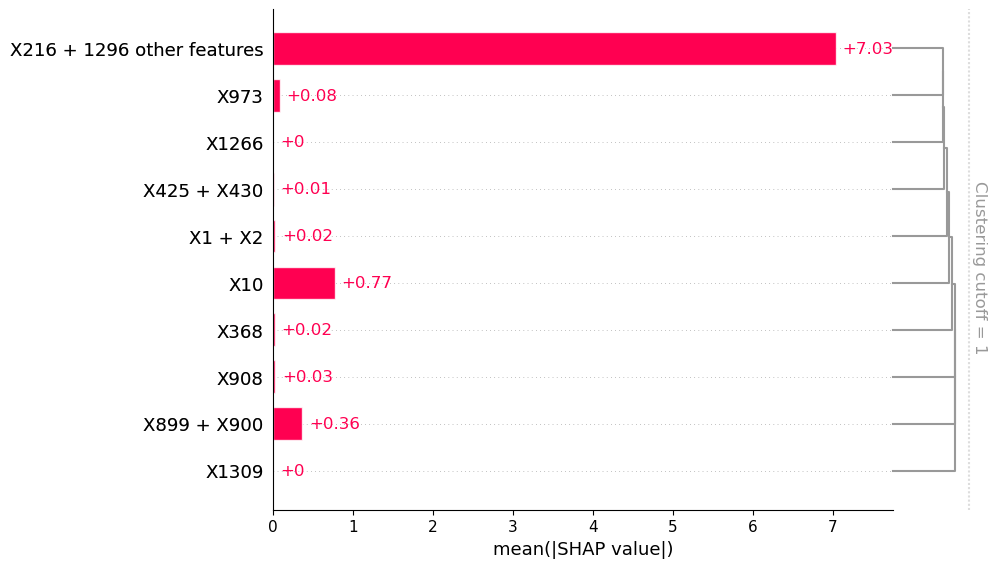

In [6]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error

params = {
    'eta': 0.1,  # Increased learning rate
    'subsample': 0.9,  # Using more of the data for each tree
    'max_depth': 7,  # Allowing trees to grow deeper
    'objective': 'binary:logistic',  # Assuming a binary classification problem
    'eval_metric': 'logloss',  # Can be changed to 'auc', 'error', etc., based on the problem
}

def fit_xgboost(X, y, n_splits=5):
    """Train an XGBoost model using cross-validation and print the accuracy and mean squared error."""
    accuracy_scores = []
    mse_scores = []
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        dtrain = xgboost.DMatrix(X_train, label=y_train)
        dtest = xgboost.DMatrix(X_test, label=y_test)
       
        model = xgboost.train(
            params,
            dtrain,
            num_boost_round=1000,  # Starting with a reasonable number of rounds
            evals=[(dtest, "test")],
            early_stopping_rounds=50,  # Adjust based on validation set performance
            verbose_eval=True  # Set to True to see the training progress
        )
       
        # Predict the probabilities
        y_pred_prob = model.predict(dtest)
        # Convert probabilities to binary predictions
        y_pred = np.where(y_pred_prob > 0.5, 1, 0)
       
        # Calculate the accuracy for the current fold
        accuracy = np.sum(y_pred == y_test) / len(y_test)
        accuracy_scores.append(accuracy)
       
        # Calculate the mean squared error for the current fold
        mse = mean_squared_error(y_test, y_pred_prob)
        mse_scores.append(mse)

    # Average accuracy across all folds
    mean_accuracy = np.mean(accuracy_scores)
    print(f"Average model accuracy across all folds: {mean_accuracy:.4f}")
   
    # Average MSE across all folds
    mean_mse = np.mean(mse_scores)
    print(f"Average model MSE across all folds: {mean_mse:.4f}")

    return model

y = data["Y"]
X = data.drop(["Y"], axis=1)

model = fit_xgboost(X, y)
explainer = shap.Explainer(model)
shap_values = explainer(X)

clust = shap.utils.hclust(X, y, linkage="single")
shap.plots.bar(shap_values, clustering=clust, clustering_cutoff=1)

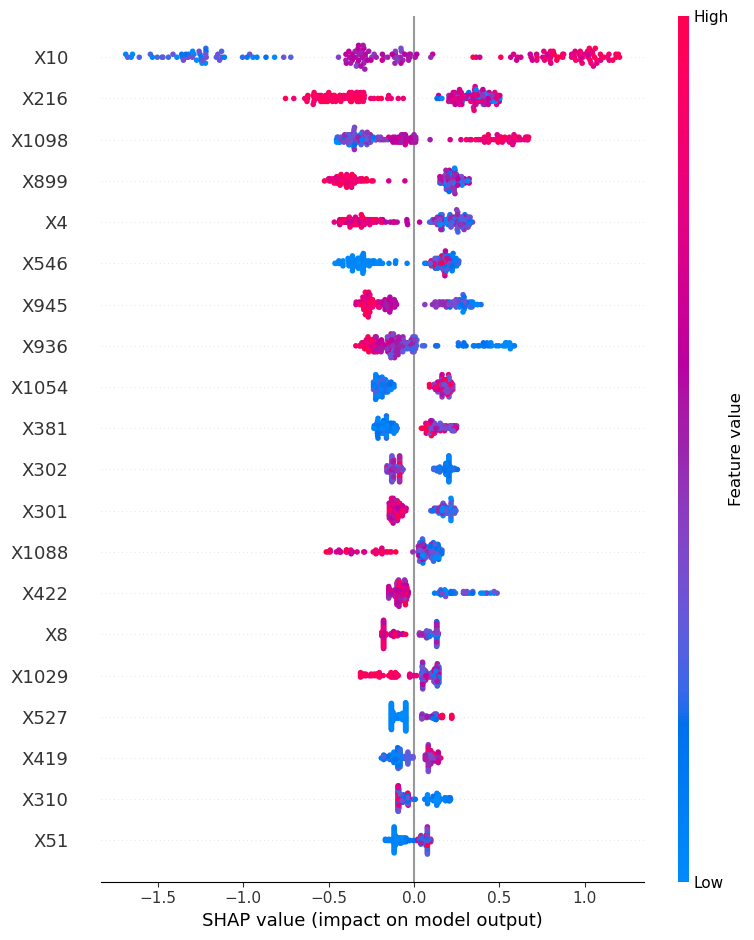

In [10]:
shap.summary_plot(shap_values, features=X, feature_names=X.columns)

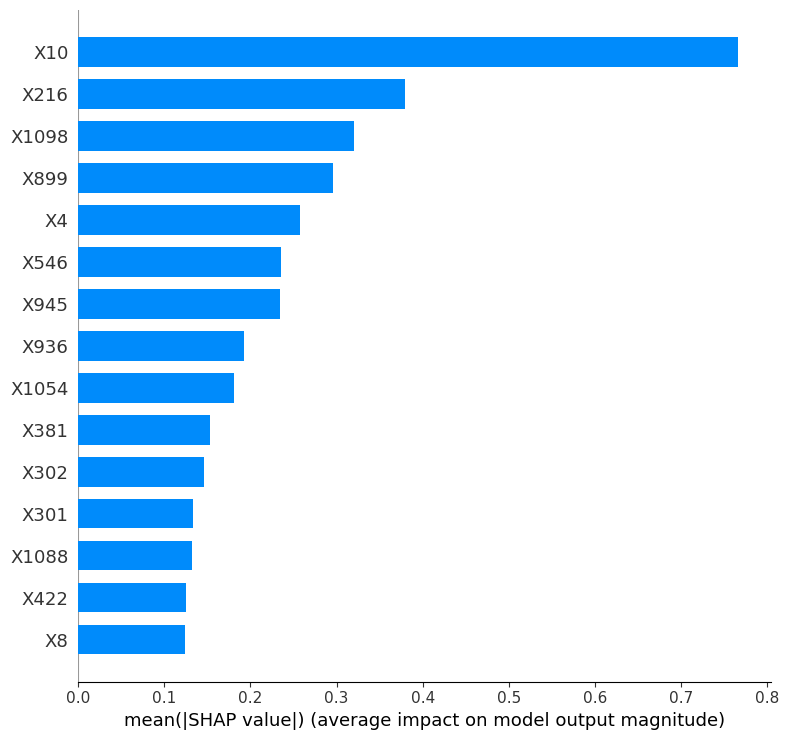

In [11]:
shap.summary_plot(shap_values, max_display=15, show=False, plot_type='bar', feature_names= X.columns)

<h1>Calculate the marginal effects of Variables on the Outcome</h1>

<h3>Define a Function to apply Interventions</h3>

In [12]:
class FixableDataFrame(pd.DataFrame):
    """Helper class for manipulating generative models."""

    def __init__(self, *args, fixed={}, **kwargs):
        self.__dict__["__fixed_var_dictionary"] = fixed
        super().__init__(*args, **kwargs)

    def __setitem__(self, key, value):
        out = super().__setitem__(key, value)
        if isinstance(key, str) and key in self.__dict__["__fixed_var_dictionary"]:
            out = super().__setitem__(key, self.__dict__["__fixed_var_dictionary"][key])
        return out

In [13]:
def intervention(data, fixed={}, seed=0):
  if seed is not None:
        np.random.seed(seed)
  X = FixableDataFrame(data.copy(), fixed=fixed)
  # Iterate over the fixed interventions and apply them
  for key, value in fixed.items():
      if key in X.columns:
          X[key] = value
  return X

<h3>Define the Marginal Effect Function</h3>

In [14]:
def marginal_effects(data, max_points=20, logit=True, seed=0):
    """Helper function to compute the true marginal causal effects."""
    X = intervention(data)
    columns = X.columns
    ys = [[] for _ in columns]
    xs = [X[c].values for c in columns]
    xs = np.sort(xs, axis=1)
    xs = [xs[i] for i in range(len(xs))]
    for i, c in enumerate(columns):
        xs[i] = np.unique(
            [
                np.nanpercentile(xs[i], v, method="nearest")
                for v in np.linspace(0, 100, max_points)
            ]
        )
        for x in xs[i]:
            Xnew = intervention(data, fixed={c: x}, seed=seed)
            Xnew = Xnew.drop(["Y"], axis=1)
            data_dmatrix = xgboost.DMatrix(Xnew)
            prediction = model.predict(data_dmatrix)
            val = prediction.mean()
            if logit:
                val = scipy.special.logit(val)
            ys[i].append(val)
        ys[i] = np.array(ys[i])
    ys = [ys[i] - ys[i].mean() for i in range(len(ys))]
    return list(zip(xs, ys))

In [15]:
marginal_effects = marginal_effects(data)

<h1>Marginal Effects vs Shapely Values</h1>

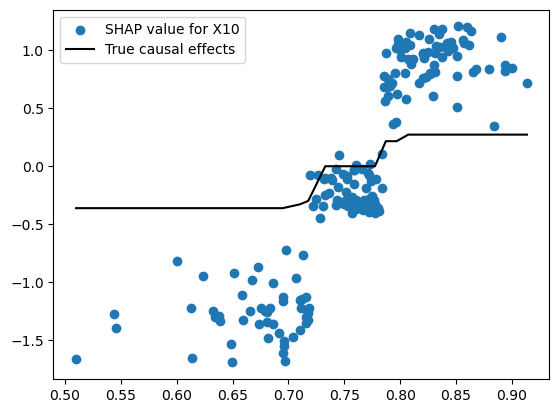

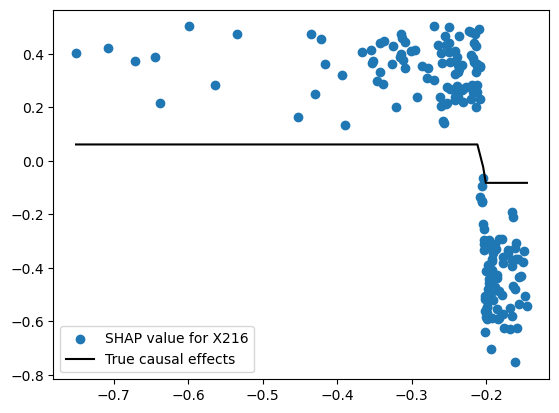

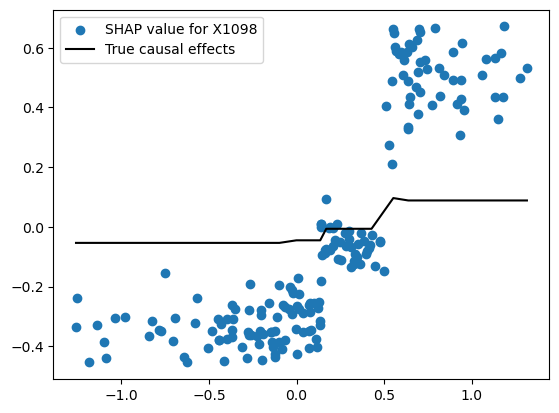

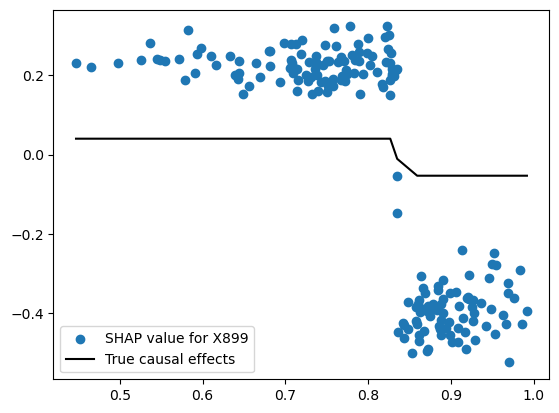

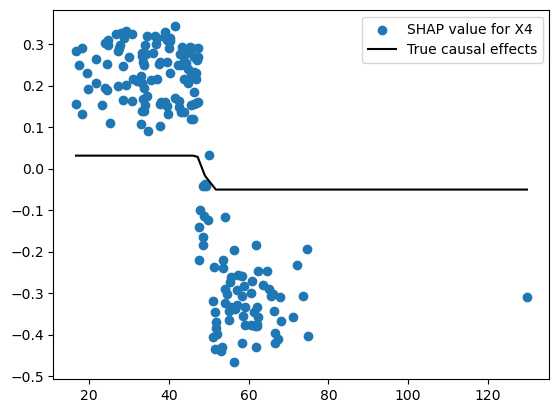

...

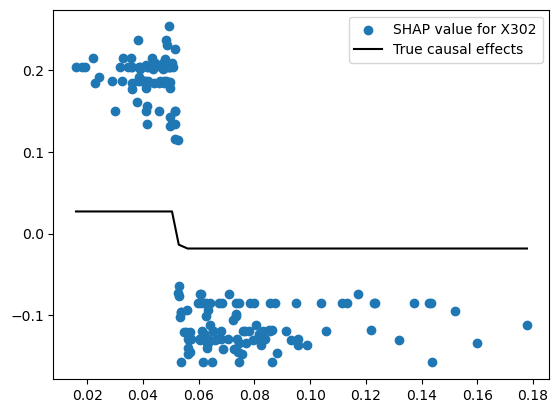

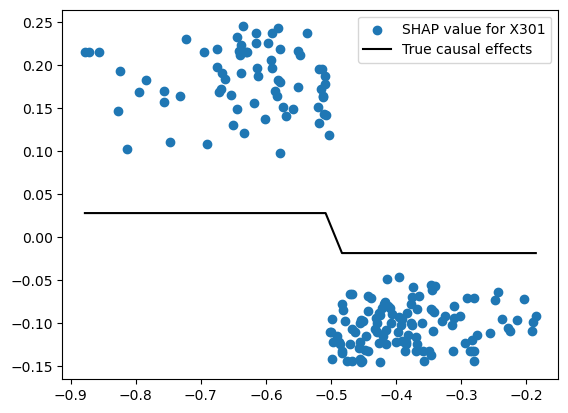

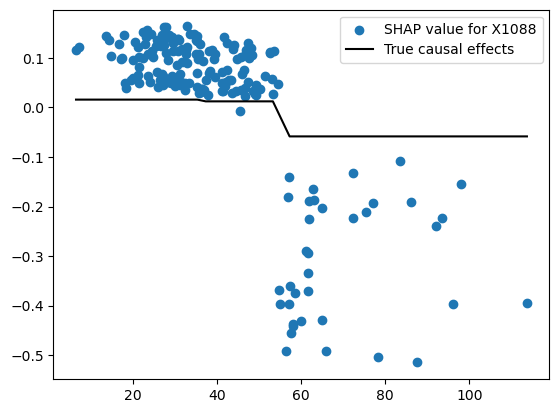

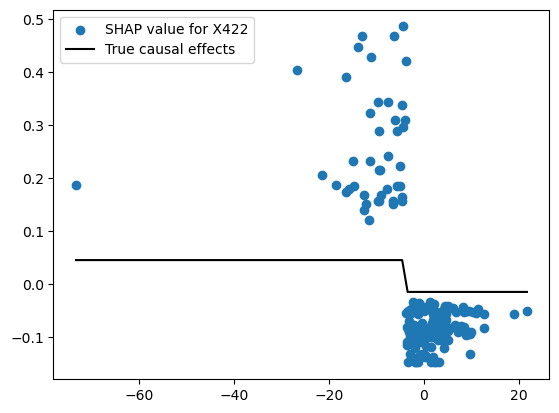

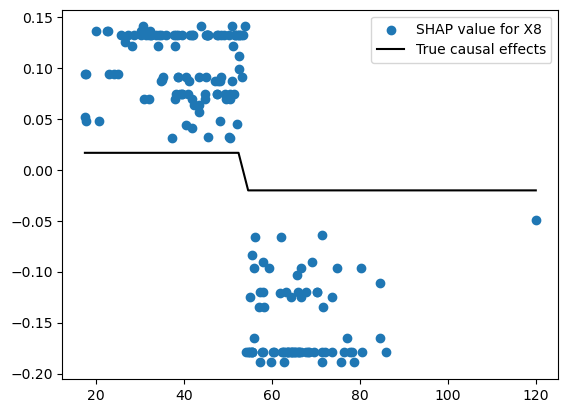

In [17]:
import matplotlib.pyplot as plt

columns = list(X.columns)
# Retrieve SHAP values in NumPy format
shap_array = shap_values.values if isinstance(shap_values, shap.Explanation) else shap_values

# Extract the top 15 feature indices based on SHAP importance
sorted_indices = np.argsort(np.mean(np.abs(shap_array), axis=0))[::-1][:15]
important_features = [columns[i] for i in sorted_indices]

# Filter SHAP values for the important features
filtered_shap_values = shap_array[:, sorted_indices]

# Plot scatter plots for each of the top 15 features and add the marginal effects
for i, feature in enumerate(important_features):
    # Get marginal effects corresponding to the feature
    marginal_effect = marginal_effects[sorted_indices[i]]
    x, y = marginal_effect  # Unpack x and y arrays from marginal effects

    # Create a scatter plot with overlay for the current feature

    plt.scatter(shap_values[:,sorted_indices[i]].data,shap_values[:,sorted_indices[i]].values ,label=f"SHAP value for {feature}")

    # # Plot true causal effects on top of the scatter plot
    plt.plot(x, y, color='black', label='True causal effects')
    plt.legend()
    plt.show()


<h1>DoublML Approach</h1>

In [18]:
!pip install doubleml

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


 **Since the DoubleML model provides an overall effect rather than feature-specific causal effects, the way we overlay these results might differ from what your original code intended. If the original intent was to map feature-specific causal effects, please note that such direct mapping isn't typically available from DoubleML, which focuses on the treatment effect as a whole.**

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (con

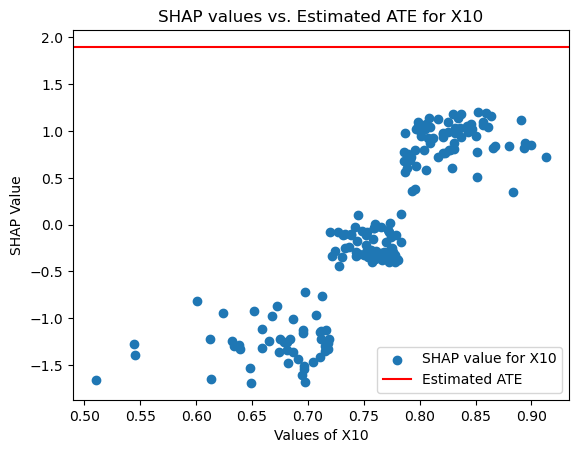

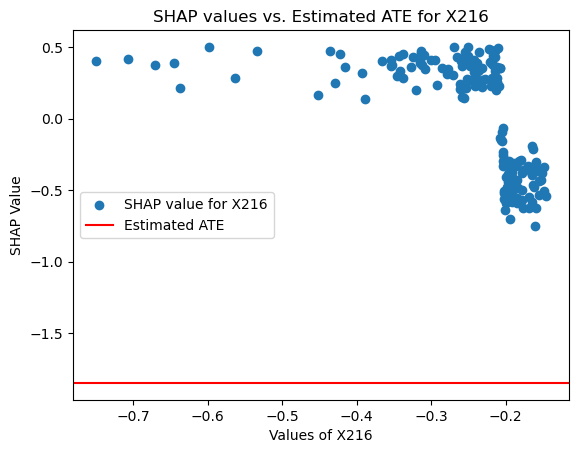

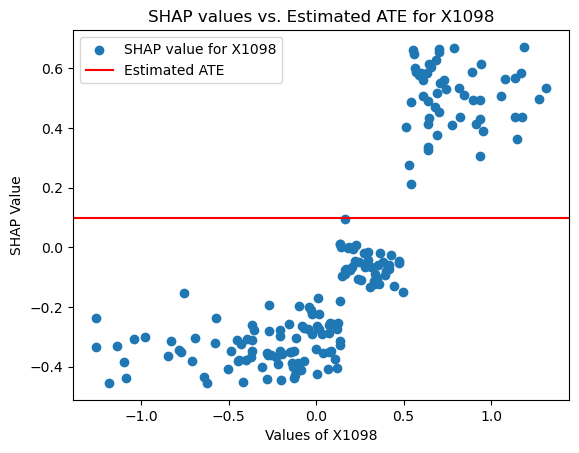

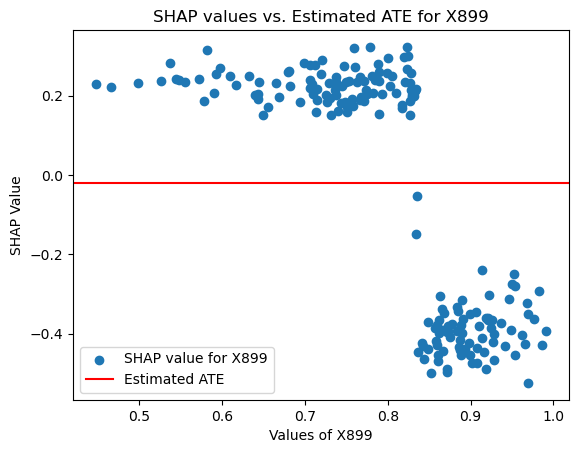

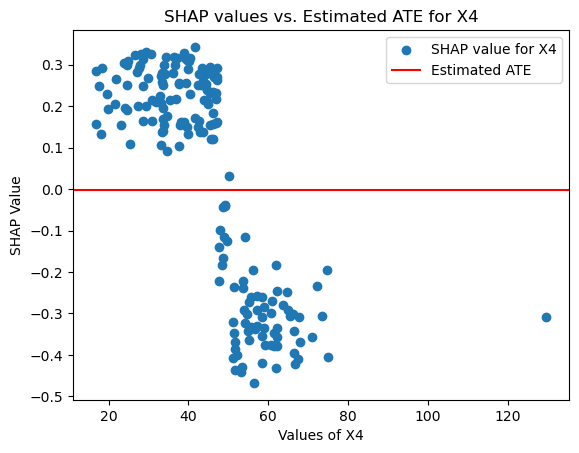

...

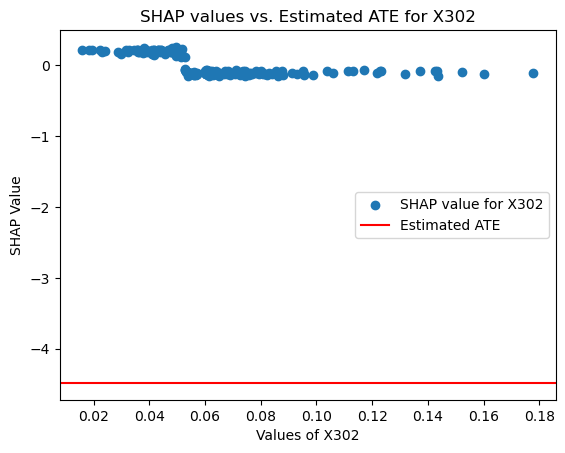

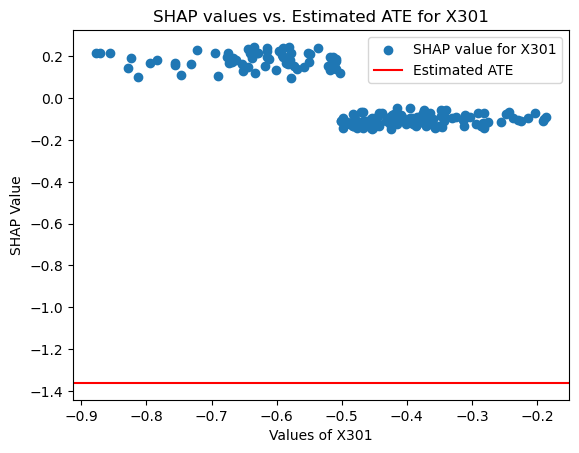

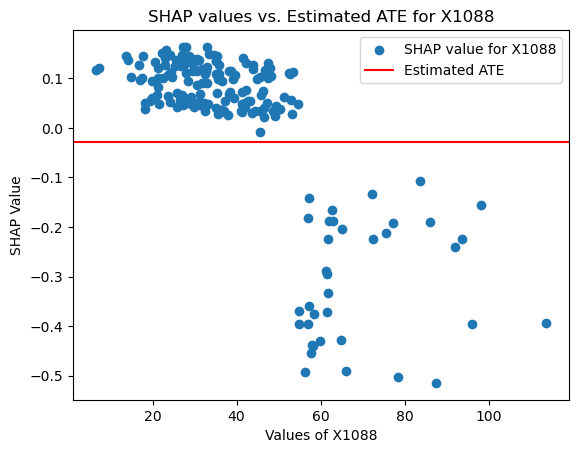

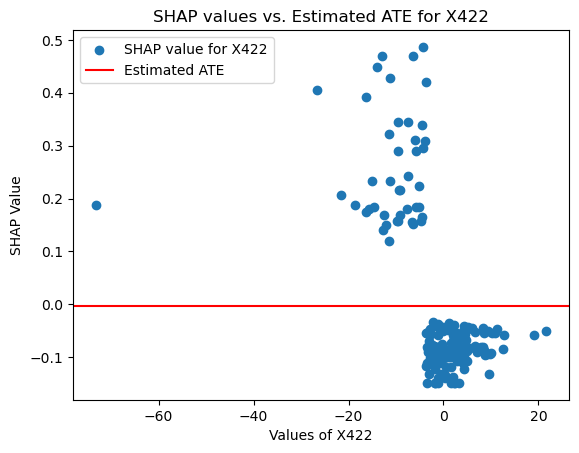

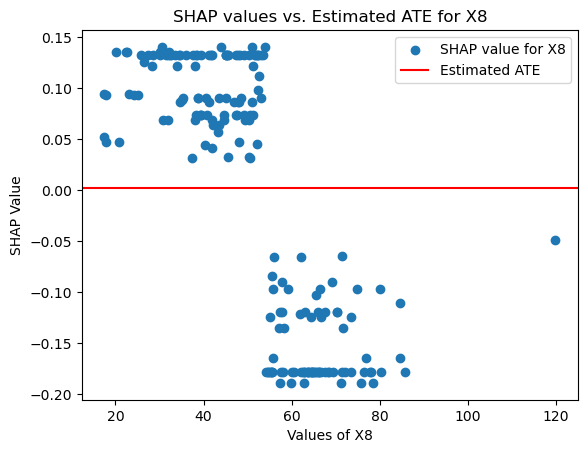

In [19]:
from doubleml import DoubleMLData, DoubleMLPLR
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.base import clone

# Retrieve SHAP values in NumPy format
shap_array = shap_values.values if isinstance(shap_values, shap.Explanation) else shap_values

# Extract the top 15 feature indices based on SHAP importance
sorted_indices = np.argsort(np.mean(np.abs(shap_array), axis=0))[::-1][:15]
important_features = [columns[i] for i in sorted_indices]

# Filter SHAP values for the important features
filtered_shap_values = shap_array[:, sorted_indices]

ate = []
for feature in important_features:
    dml_data = DoubleMLData(data, y_col='Y', d_cols=feature)
    df_train, df_test = train_test_split(data, test_size=0.3, random_state=123)
    learner = XGBRegressor(n_estimators=100, random_state=123, use_label_encoder=False)
    ml_g = clone(learner)  # model for the outcome equation
    ml_m = clone(learner)  # model for the treatment equation
    dml_plr = DoubleMLPLR(dml_data, ml_g, ml_m)
    dml_plr.fit()
    # ATE from DoubleML as the causal effect
    ate.append(dml_plr.summary['coef'][0])  # assuming the first coefficient is ATE

# Plot scatter plots for each of the top 15 features
for i, feature in enumerate(important_features):
    plt.figure()
    plt.scatter(data[feature], filtered_shap_values[:, i], label=f"SHAP value for {feature}")
    plt.axhline(y=ate[i], color='r', linestyle='-', label='Estimated ATE')
    plt.title(f"SHAP values vs. Estimated ATE for {feature}")
    plt.xlabel(f"Values of {feature}")
    plt.ylabel("SHAP Value")
    plt.legend()
    plt.show()

<h1>MEAN PEACE </h1>

<h3>Estimate the distributions of the Variables</h3>

In [20]:
from sklearn.neighbors import KernelDensity
from scipy.integrate import quad

# Function to fit KDE and return a probability density function
def fit_kde_and_get_pdf(column_data):
    # Reshape data for sklearn (it expects a 2D array)
    data = column_data.values.reshape(-1, 1)

    # Fit the KDE model
    kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(data)

    # Define a function to represent the PDF using the KDE
    def pdf(x):
        return np.exp(kde.score_samples([[x]]))[0]

    return pdf

# Dictionary to hold the PDF functions for each column
pdf_functions = {}

for column in X:
    pdf_functions[column] = fit_kde_and_get_pdf(data[column])

# Now, pdf_functions contains a function for each column that computes the probability density.

<h3>Define PEACE Function</h3>

In [21]:
def PEACE(d):
  peace = {}
  for c in X.columns:
    index = X.columns.get_loc(c)
    effect = 0
    for i in range(1, len(marginal_effects[index][0])):
      effect += abs(marginal_effects[index][1][i] - marginal_effects[index][1][i-1])*(4*(pdf_functions[c](marginal_effects[index][0][i])*pdf_functions[c](marginal_effects[index][0][i-1]))**d)
    peace[c] = effect
  return peace

<h3>Calculate PEACE Values of Different Degrees</h3>

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Assume that PEACE is a function that computes PEACE values for given d
d_values = np.linspace(0, 1, 100)
peace_values = {c: [] for c in X.columns}

# Compute PEACE(d) for each d value
for d in d_values:
    peace = PEACE(d)
    for c in peace:
        peace_values[c].append(peace[c])

<h3>Define the Availability Function and Use it to Calculate the MEAN PEACE Values</h3>

In [23]:
def precompute_pdf_values(X, pdf_functions):
    pdf_values = {}
    for c in X.columns:
        pdf_values[c] = np.array([pdf_functions[c](val) for val in marginal_effects[X.columns.get_loc(c)][0]])
    return pdf_values

def Availability(d, X, pdf_values):
    availability = {}
    for c in X.columns:
        pdf_vals = pdf_values[c]
        availability[c] = np.sum(
            (4 * pdf_vals[1:] * pdf_vals[:-1]) ** d
        )
    return availability

# Precompute the PDF values once
pdf_values = precompute_pdf_values(X, pdf_functions)

availability_values = {c: [Availability(d, X, pdf_values)[c] for d in d_values] for c in X.columns}
mean_peace_values = {c: np.array(peace_values[c]) / np.array(availability_values[c]) for c in X.columns}

<h3>Plot the 15 highest Mean PEACE Functions</h3>

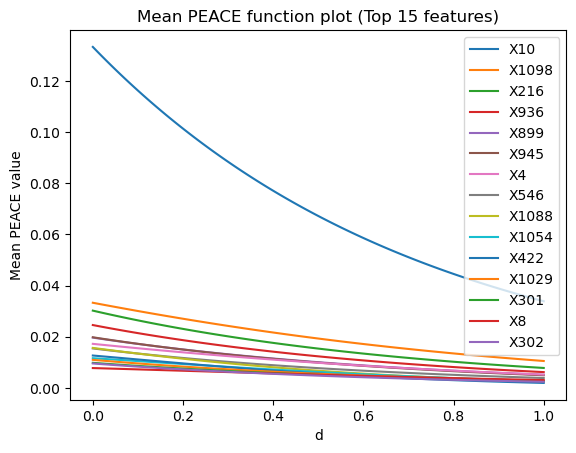

In [24]:
# Compute the mean of mean_peace_values for sorting
mean_peace_means = {c: np.mean(values) for c, values in mean_peace_values.items()}

# Get the top 15 features with the highest mean PEACE values
top_15_features = sorted(mean_peace_means, key=mean_peace_means.get, reverse=True)[:15]

# Plot the results for the top 15 features
for c in top_15_features:
    plt.plot(d_values, mean_peace_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean PEACE value')
plt.title('Mean PEACE function plot (Top 15 features)')
plt.legend()
plt.show()

<h3>Plot all Mean PEACE Functions</h3>

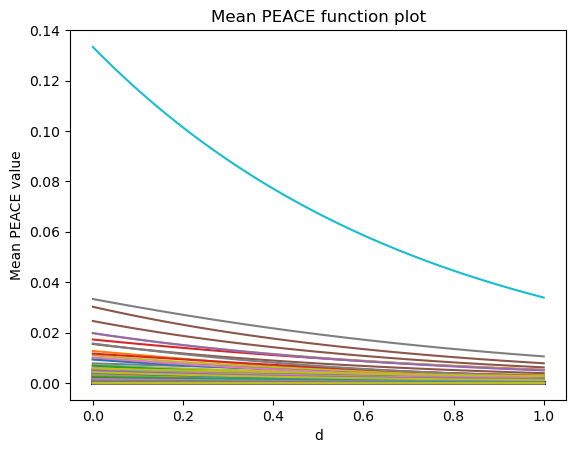

In [25]:
for c in mean_peace_values:
    plt.plot(d_values, mean_peace_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean PEACE value')
plt.title('Mean PEACE function plot')
plt.show()

<h3> Plot 15 highest MEAN PEACE Functions One by One

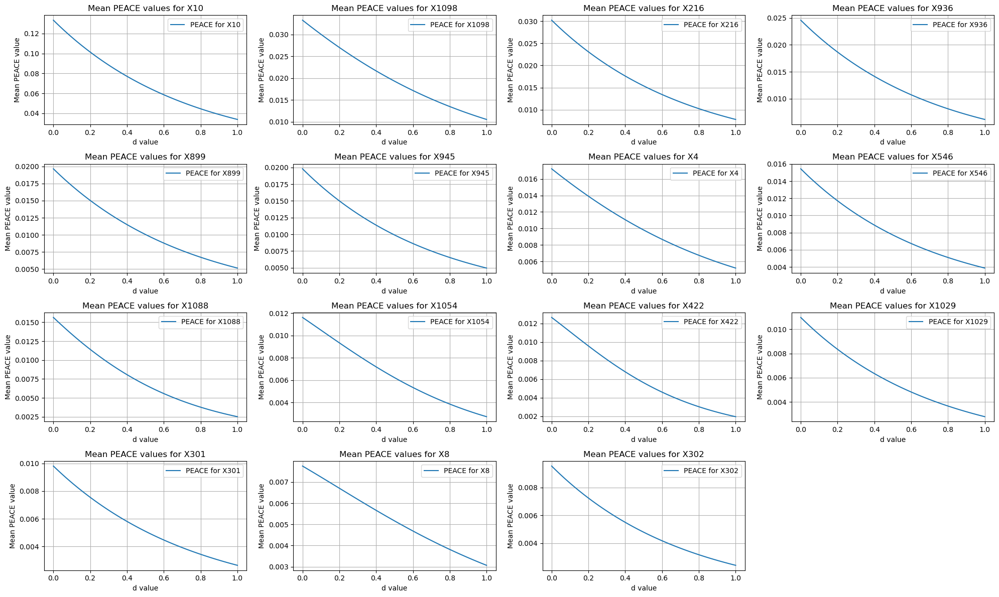

In [26]:
import numpy as np
import matplotlib.pyplot as plt


# Create subplots with appropriate grid size
num_features = len(top_15_features)
num_rows = int(np.ceil(np.sqrt(num_features)))
num_cols = int(np.ceil(num_features / num_rows))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 3 * num_rows))

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Plot only the top 15 features
for i, c in enumerate(top_15_features):
    ax = axs[i]
    ax.plot(d_values, mean_peace_values[c], label=f'PEACE for {c}')
    ax.set_xlabel('d value')
    ax.set_ylabel('Mean PEACE value')
    ax.set_title(f'Mean PEACE values for {c}')
    ax.legend()
    ax.grid(True)

# Hide any unused axes
for j in range(i + 1, num_rows * num_cols):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


<h3>Plot All Mean PEACE Functions One by One</h3>

In [27]:
import numpy as np
import matplotlib.pyplot as plt

num_columns = len(X.columns)

# Calculate the grid size
num_rows = int(np.ceil(np.sqrt(num_columns)))
num_cols = int(np.ceil(num_columns / num_rows))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 3 * num_rows))

# Flatten the axes array for easy indexing
axs = axs.flatten()

for i, (c, values) in enumerate(mean_peace_values.items()):
    ax = axs[i]
    ax.plot(d_values, values, label=f'PEACE for {c}')
    ax.set_xlabel('d value')
    ax.set_ylabel('Mean PEACE value')
    ax.set_title(f'Mean PEACE values as a function of d for {c}')
    ax.legend()
    ax.grid(True)

# Hide any unused axes
for j in range(i + 1, num_rows * num_cols):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


<h3>Print all Variables whose MEAN PEACE Functions have at Least One value Greater than 0.1</h3>

In [28]:
#  PEACE > 0.01
columns_with_values = {col: max(values) for col, values in mean_peace_values.items() if any(value > 0.01 for value in values)}
formatted_columns_with_values = [f"{col},{value:.2f}" for col, value in columns_with_values.items()]

formatted_columns_with_values

['X4,0.02',
 'X10,0.13',
 'X216,0.03',
 'X422,0.01',
 'X546,0.02',
 'X899,0.02',
 'X936,0.02',
 'X945,0.02',
 'X1029,0.01',
 'X1054,0.01',
 'X1087,0.01',
 'X1088,0.02',
 'X1098,0.03']

<h1>MEAN Positive PEACE</h1>

<h3> Define Positive PEACE Function</h3>

In [29]:
def positive(r):
  return max(r,0)

def PEACE_positive(d):
  peace_positive = {}
  for c in X.columns:
    index = X.columns.get_loc(c)
    effect = 0
    for i in range(1, len(marginal_effects[index][0])):
      effect += positive(marginal_effects[index][1][i] - marginal_effects[index][1][i-1])*((4*pdf_functions[c](marginal_effects[index][0][i])*pdf_functions[c](marginal_effects[index][0][i-1])**d))
    peace_positive[c] = effect
  return peace_positive

<h3> Calculate Positive PEACE Values, Define Mean Positive PEACE Function, Calculate its Values, and Plot the 15 Highest MEAN Positive PEACE Functions </h3>

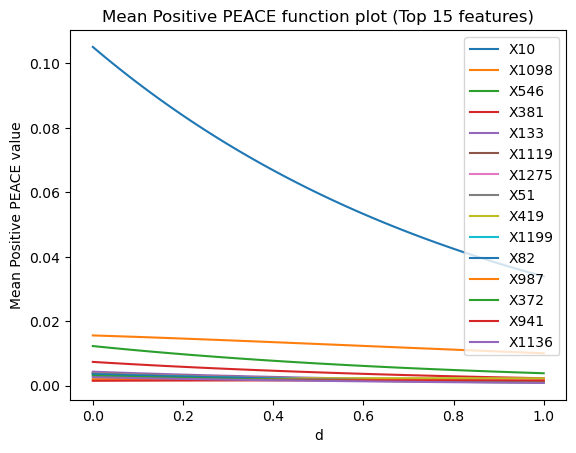

In [31]:
# Initialize a dictionary to hold the computed values
peace_positive_values = {c: [] for c in X.columns}

# Compute PEACE(d) for each d value
for d in d_values:
    peace_positive = PEACE_positive(d)
    for c in peace:
        peace_positive_values[c].append(peace_positive[c])

mean_peace_positive_values = {c: np.array(peace_positive_values[c]) / np.array(availability_values[c]) for c in X.columns}

# Compute the mean of mean_peace_values for sorting
mean_peace_positive_means = {c: np.mean(values) for c, values in mean_peace_positive_values.items()}

# Get the top 15 features with the highest mean PEACE values
top_15_features = sorted(mean_peace_positive_means, key=mean_peace_positive_means.get, reverse=True)[:15]

# Plot the results for the top 15 features
for c in top_15_features:
    plt.plot(d_values, mean_peace_positive_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean Positive PEACE value')
plt.title('Mean Positive PEACE function plot (Top 15 features)')
plt.legend()
plt.show()

<h3>Plot the Mean Positive PEACE Functions of All Variables</h3>

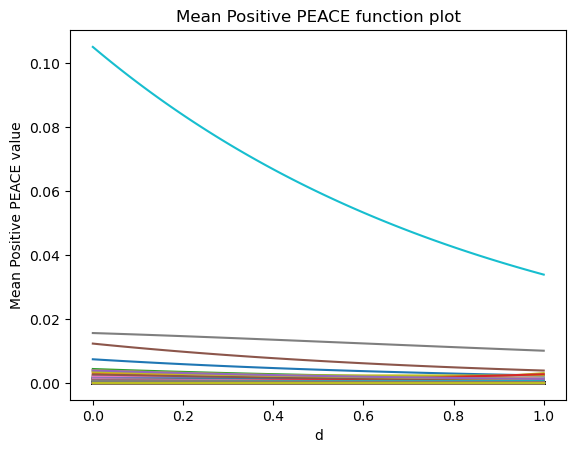

In [40]:
for c in mean_peace_positive_values:
    plt.plot(d_values, mean_peace_positive_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean Positive PEACE value')
plt.title('Mean Positive PEACE function plot')
plt.show()

<h3>Print All Variables whose Positive PEACE Value Function have at Least One Value Greater than 0.001</h3>

In [33]:
columns_with_values = {col: max(values) for col, values in mean_peace_positive_values.items()
                       if any(float(value) > 0.001 for value in values if isinstance(value, str) or isinstance(value, float))}
formatted_columns_with_values = [f"{col},{value:.3f}" for col, value in columns_with_values.items()]

formatted_columns_with_values


['X2,0.002',
 'X10,0.105',
 'X38,0.001',
 'X51,0.004',
 'X82,0.004',
 'X105,0.002',
 'X124,0.001',
 'X133,0.004',
 'X135,0.002',
 'X279,0.003',
 'X286,0.002',
 'X320,0.002',
 'X338,0.001',
 'X351,0.001',
 'X368,0.001',
 'X372,0.003',
 'X381,0.007',
 'X419,0.002',
 'X435,0.001',
 'X502,0.001',
 'X523,0.001',
 'X546,0.012',
 'X558,0.001',
 'X567,0.002',
 'X761,0.001',
 'X794,0.001',
 'X838,0.002',
 'X850,0.001',
 'X941,0.002',
 'X987,0.002',
 'X1012,0.001',
 'X1028,0.001',
 'X1054,0.003',
 'X1090,0.001',
 'X1098,0.016',
 'X1119,0.004',
 'X1136,0.003',
 'X1147,0.001',
 'X1199,0.003',
 'X1275,0.004']

<h1> MEAN Negative PEACE <h1>

<h3>Define Mean Negative PEACE Function</h3>

In [34]:
def negative(r):
  return max(-r,0)

def PEACE_negative(d):
  peace_negative = {}
  for c in X.columns:
    index = X.columns.get_loc(c)
    effect = 0
    for i in range(1, len(marginal_effects[index][0])):
      effect += negative(marginal_effects[index][1][i] - marginal_effects[index][1][i-1])*((4*pdf_functions[c](marginal_effects[index][0][i])*pdf_functions[c](marginal_effects[index][0][i-1])**d))
      peace_negative[c] = effect
  return peace_negative

<h3> Calculate Negative PEACE Values, Define Mean Negative PEACE Function, Calculate its Values, and Plot the 15 Highest MEAN Negative PEACE Functions </h3>

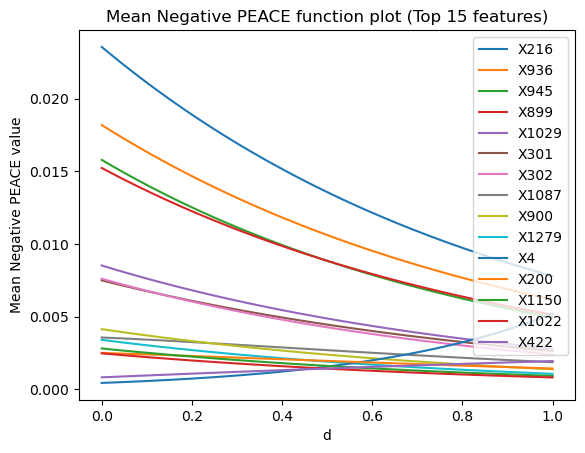

In [35]:
# Initialize a dictionary to hold the computed values
peace_negative_values = {c: [] for c in X.columns}

# Compute PEACE(d) for each d value
for d in d_values:
    peace_negative = PEACE_negative(d)
    for c in peace:
        peace_negative_values[c].append(peace_negative[c])

mean_peace_negative_values = {c: np.array(peace_negative_values[c]) / np.array(availability_values[c]) for c in X.columns}

# Compute the mean of mean_peace_values for sorting
mean_peace_negative_means = {c: np.mean(values) for c, values in mean_peace_negative_values.items()}

# Get the top 15 features with the highest mean PEACE values
top_15_features = sorted(mean_peace_negative_means, key=mean_peace_negative_means.get, reverse=True)[:15]

# Plot the results for the top 15 features
for c in top_15_features:
    plt.plot(d_values, mean_peace_negative_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean Negative PEACE value')
plt.title('Mean Negative PEACE function plot (Top 15 features)')
plt.legend()
plt.show()

<h3>Plot the Mean Negative PEACE Functions of All Variables</h3>

<h3>Print All Variables whose Negative PEACE Value Function have at Least One Value Greater than 0.001</h3>

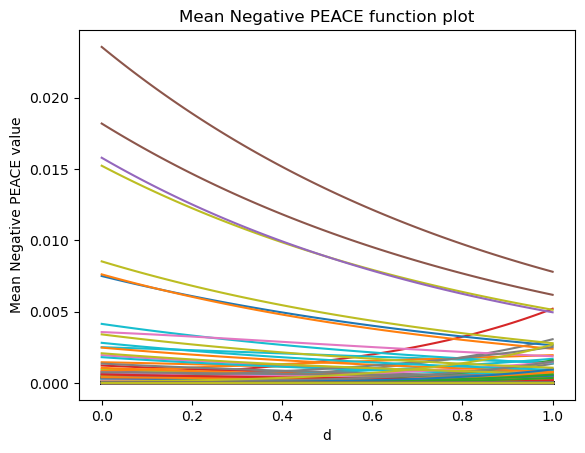

In [41]:
for c in mean_peace_negative_values:
    plt.plot(d_values, mean_peace_negative_values[c], label=c)

plt.xlabel('d')
plt.ylabel('Mean Negative PEACE value')
plt.title('Mean Negative PEACE function plot')
plt.show()

In [37]:
#negative_peace>0.001

columns_with_values = {col: max(values) for col, values in mean_peace_negative_values.items()
                       if any(float(value) > 0.001 for value in values if isinstance(value, str) or isinstance(value, float))}
formatted_columns_with_values = [f"{col},{value:.3f}" for col, value in columns_with_values.items()]

formatted_columns_with_values


['X4,0.005',
 'X8,0.003',
 'X97,0.002',
 'X172,0.001',
 'X200,0.003',
 'X216,0.024',
 'X254,0.001',
 'X301,0.007',
 'X302,0.008',
 'X310,0.002',
 'X422,0.002',
 'X529,0.001',
 'X588,0.001',
 'X899,0.015',
 'X900,0.004',
 'X908,0.001',
 'X936,0.018',
 'X940,0.002',
 'X945,0.016',
 'X962,0.001',
 'X973,0.002',
 'X1017,0.001',
 'X1022,0.002',
 'X1029,0.009',
 'X1087,0.004',
 'X1088,0.003',
 'X1150,0.003',
 'X1168,0.001',
 'X1169,0.002',
 'X1189,0.003',
 'X1279,0.003']

<h1> Plot the 15 Highest Mean Positive Functions vs Their Corresponding Mean Negative Functions</h1>

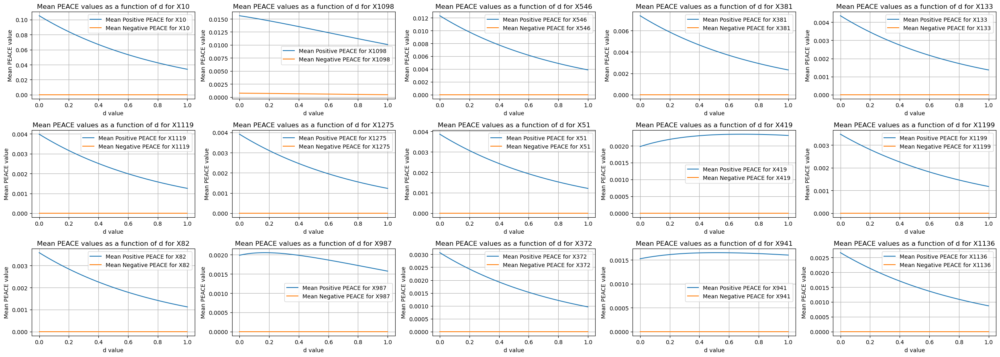

In [38]:
# Compute the mean of mean_peace_positive_values for sorting
mean_peace_positive_means = {c: np.mean(values) for c, values in mean_peace_positive_values.items()}

# Get the top 15 features with the highest mean PEACE values
top_15_features = sorted(mean_peace_positive_means, key=mean_peace_positive_means.get, reverse=True)[:15]

# Set up the grid dimensions for the plots
num_features = len(top_15_features)
rows = int(np.sqrt(num_features))
cols = int(np.ceil(num_features / rows))

fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 3 * rows))
axs = axs.flatten()  # Flatten the array to make it easier to iterate over

for i, c in enumerate(top_15_features):
    ax = axs[i]
    ax.plot(d_values, mean_peace_positive_values[c], label=f'Mean Positive PEACE for {c}')
    ax.plot(d_values, mean_peace_negative_values[c], label=f'Mean Negative PEACE for {c}')
    ax.set_xlabel('d value')
    ax.set_ylabel('Mean PEACE value')
    ax.set_title(f'Mean PEACE values as a function of d for {c}')
    ax.legend()
    ax.grid(True)

# Hide any unused subplots
for j in range(i + 1, rows * cols):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


<h1> Plot the 15 Highest Mean Negative Functions vs Their Corresponding Mean Positive Functions</h1>

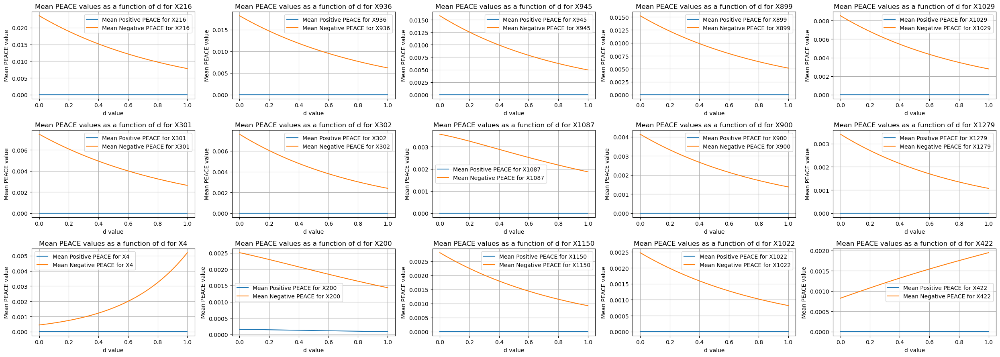

In [42]:
# Compute the mean of mean_peace_negative_values for sorting
mean_peace_negative_means = {c: np.mean(values) for c, values in mean_peace_negative_values.items()}

# Get the top 15 features with the highest mean PEACE values
top_15_features = sorted(mean_peace_negative_means, key=mean_peace_negative_means.get, reverse=True)[:15]

# Set up the grid dimensions for the plots
num_features = len(top_15_features)
rows = int(np.sqrt(num_features))
cols = int(np.ceil(num_features / rows))

fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 3 * rows))
axs = axs.flatten()  # Flatten the array to make it easier to iterate over

for i, c in enumerate(top_15_features):
    ax = axs[i]
    ax.plot(d_values, mean_peace_positive_values[c], label=f'Mean Positive PEACE for {c}')
    ax.plot(d_values, mean_peace_negative_values[c], label=f'Mean Negative PEACE for {c}')
    ax.set_xlabel('d value')
    ax.set_ylabel('Mean PEACE value')
    ax.set_title(f'Mean PEACE values as a function of d for {c}')
    ax.legend()
    ax.grid(True)

# Hide any unused subplots
for j in range(i + 1, rows * cols):
    axs[j].axis('off')

plt.tight_layout()
plt.show()
